<a href="https://colab.research.google.com/github/BOSS-Danuphan/jupyter_notebook_ds/blob/master/the-winton-stock-market-challenge.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# The Winton Stock Market Challenge

Kaggle challenge page: https://www.kaggle.com/c/the-winton-stock-market-challenge

**Challenge:**
- Too many missing values
- Unknown meaning on each feature columns

**Evaluation metric**
$$WMAE=\frac{1}{n}\sum_{i=1}^{n}w_i\cdot \left | y_i - \hat{y_i}\right |$$

where $w_i$ is the weight associated with the return, *Weight_Intraday*, *Weight_Daily* for intraday and daily returns, $i$, $y_i$ is the predicted return, $\hat{y_i}$ is the actual return, $n$ is the number of predictions

In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from math import ceil
import time
import os

from scipy.stats import pearsonr

pd.set_option('display.max_rows', 300)
pd.set_option('display.max_columns', 300)

seed=100
np.random.seed(seed)

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler

from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score, cross_validate

from xgboost import XGBRegressor

from IPython.display import clear_output

In [0]:
!pip install -q tensorflow-gpu==2.0.0-beta1
import tensorflow as tf
# %load_ext tensorboard
print(tf.__version__)

     |████████████████████████████████| 348.9MB 48kB/s 
     |████████████████████████████████| 3.1MB 50.5MB/s 
     |████████████████████████████████| 501kB 56.1MB/s 
2.0.0-beta1


In [0]:
def corrWithPValue(df):
    df = df._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns, dtype='float')
    corr = dfcols.transpose().join(dfcols, how='outer')
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    for r in df.columns:
        for c in df.columns:
            mask = df[r].notnull() & df[c].notnull()
            result = pearsonr(df[mask][r], df[mask][c])
            corr[r][c] = round(result[0], 2)
            pvalues[r][c] = round(result[1], 4)
    return corr, pvalues

def plotCorr(df, title='', figsize=None, corr_threshold=None, p_threshold=None):
    ncolumns = len(df.columns)
    # Compute the correlation matrix
    corr, pval = corrWithPValue(df)

    annotate = corr.astype(str)
    annotate[pval <= 0.1] = annotate[pval <= 0.1] + '*'
    annotate[pval <= 0.05] = annotate[pval <= 0.05] + '*'
    annotate[pval <= 0.01] = annotate[pval <= 0.01] + '*'

    # Generate a mask for the upper triangle
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    if corr_threshold:
        mask = np.logical_or((corr.abs() < corr_threshold).to_numpy(),mask)

    if p_threshold:
        mask = np.logical_or((pval < p_threshold).to_numpy(),mask)

    # Set up the matplotlib figure
    if figsize is None:
        fsize = int(ncolumns*.75)
        figsize = (fsize, fsize)
    plt.figure(figsize=figsize)

    # Draw the heatmap with the mask and correct aspect ratio
    ax = sns.heatmap(corr, mask=mask, cmap='bwr', vmin=-1, vmax=1, center=0,
                     square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=annotate, fmt='', linecolor='#dddddd')
    
    # Add pval annotation description
    ax.text(x=figsize[1]*0.85, y=figsize[0]*.15,
            s='*: p-value <= 0.1\n**: p-value <= 0.05\n***: p-value <= 0.01',
            bbox=dict(facecolor='#dddddd', edgecolor='black'))

    plt.title(title)

def lossWMAE(pred, targ, weights=None):
  """Compute loss using WMAE
  Input:
    pred    - np.ndarray, shape (batch, column size)
    targ    - np.ndarray, shape (batch, column size)
    weights - np.ndarray, shape (batch,)
  Output:
    WMAE loss.
  """
  assert (weights is None) or (len(weights.shape) == 1), 'weights shape must be (batch size,)'
  assert len(pred.shape) == 2, 'pred shape must be (batch size, column size)'
  assert len(targ.shape) == 2, 'targ shape must be (batch size, column size)'

  ae = abs(pred-targ)

  if weights is None:
    # Return MAE
    mae = ae.sum()/len(targ)
    return mae

  # Return WMAE
  wmae = (weights @ ae).sum()/len(targ)
  return wmae


## Load Dataset


**File structure:**
```
./                                   [ROOT_PATH]
|-- data/                            [DATA_PATH]
|------- test_2.csv
|------- train.csv
|-- report.ipynb                     [This file]
```

In [0]:
ROOT_PATH = './'
DATA_PATH = ROOT_PATH + 'data/'

In [0]:
# Only use this cell when getting dataset from Google Drive

# # Mount Google drive
from google.colab import drive
drive.mount('/content/gdrive')

# Specify project path
ROOT_PATH = 'gdrive/My Drive/Colab Notebooks/ML Projects/The Winton Stock Market Challenge/'
DATA_PATH = ROOT_PATH + 'data/'

In [0]:
dfTrain = pd.read_csv(DATA_PATH+'train.csv').set_index('Id')
dfTest = pd.read_csv(DATA_PATH+'test_2.csv').set_index('Id')

dayRetColumns = ['Ret_MinusTwo', 'Ret_MinusOne', 'Ret_PlusOne', 'Ret_PlusTwo']
dayRetTrainColumns = ['Ret_MinusTwo', 'Ret_MinusOne']
dayRetTargetColumns = ['Ret_PlusOne', 'Ret_PlusTwo']

intraRetColumns = ['Ret_'+str(i) for i in range(2,181)]
intraRetTrainColumns = ['Ret_'+str(i) for i in range(2,121)]
intraRetTargetColumns = ['Ret_'+str(i) for i in range(121,181)]

allRetColumns = [col for col in dfTrain.columns if col.startswith('Ret')]
allRetTrainColumns = dayRetTrainColumns + intraRetTrainColumns
allRetTargetColumns = intraRetTargetColumns + dayRetTargetColumns

featureIntColumns = ['Feature_'+str(i) for i in [1,5,7,9,10,13,16,20]]
featureColumns = [col for col in dfTrain.columns if col.startswith('Feature')]
weightColumns = ['Weight_Intraday', 'Weight_Daily']

print('dfTrain shape', dfTrain.shape)
print('dfTest shape', dfTest.shape)

dfTrain shape (40000, 210)
dfTest shape (120000, 146)


In [0]:
dfCustomRet = pd.DataFrame(index=dfTrain.index)

dfCustomRet['Ret_AllRet'] = dfTrain[allRetTrainColumns].sum(axis=1)
dfCustomRet['Ret_DayRet'] = dfTrain[dayRetColumns].sum(axis=1)
dfCustomRet['Ret_IntraRet'] = dfTrain[intraRetColumns].sum(axis=1)
dfCustomRet['Ret_AllAbsRet'] = dfTrain[allRetTrainColumns].abs().sum(axis=1)
dfCustomRet['Ret_DayAbsRet'] = dfTrain[dayRetColumns].abs().sum(axis=1)
dfCustomRet['Ret_IntraAbsRet'] = dfTrain[intraRetColumns].abs().sum(axis=1)

dfCustomRet['Ret_AllRetTrain'] = dfTrain[allRetColumns].sum(axis=1)
dfCustomRet['Ret_DayRetTrain'] = dfTrain[dayRetTrainColumns].sum(axis=1)
dfCustomRet['Ret_IntraRetTrain'] = dfTrain[intraRetTrainColumns].sum(axis=1)
dfCustomRet['Ret_AllAbsRetTrain'] = dfTrain[allRetColumns].abs().sum(axis=1)
dfCustomRet['Ret_DayAbsRetTrain'] = dfTrain[dayRetTrainColumns].abs().sum(axis=1)
dfCustomRet['Ret_IntraAbsRetTrain'] = dfTrain[intraRetTrainColumns].abs().sum(axis=1)

dfCustomRet['Ret_AllRetTarget'] = dfTrain[allRetTargetColumns].sum(axis=1)
dfCustomRet['Ret_DayRetTarget'] = dfTrain[dayRetTargetColumns].sum(axis=1)
dfCustomRet['Ret_IntraRetTarget'] = dfTrain[intraRetTargetColumns].sum(axis=1)
dfCustomRet['Ret_AllAbsRetTarget'] = dfTrain[allRetTargetColumns].abs().sum(axis=1)
dfCustomRet['Ret_DayAbsRetTarget'] = dfTrain[dayRetTargetColumns].abs().sum(axis=1)
dfCustomRet['Ret_IntraAbsRetTarget'] = dfTrain[intraRetTargetColumns].abs().sum(axis=1)

customRetColumns = dfCustomRet.columns.tolist()
customRetTrainColumns = [col for col in dfCustomRet.columns if col.endswith('Train')]
customRetTargetColumns = [col for col in dfCustomRet.columns if col.endswith('Target')]

dfTrain = dfTrain.join(dfCustomRet)

print('dfTrain shape', dfTrain.shape)

dfTrain shape (40000, 228)


In [0]:
dfTrain.sample(5)

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,Feature_10,Feature_11,Feature_12,Feature_13,Feature_14,Feature_15,Feature_16,Feature_17,Feature_18,Feature_19,Feature_20,Feature_21,Feature_22,Feature_23,Feature_24,Feature_25,Ret_MinusTwo,Ret_MinusOne,Ret_2,Ret_3,Ret_4,Ret_5,Ret_6,Ret_7,Ret_8,Ret_9,Ret_10,Ret_11,Ret_12,Ret_13,Ret_14,Ret_15,Ret_16,Ret_17,Ret_18,Ret_19,Ret_20,Ret_21,Ret_22,Ret_23,Ret_24,Ret_25,Ret_26,Ret_27,Ret_28,Ret_29,Ret_30,Ret_31,Ret_32,Ret_33,Ret_34,Ret_35,Ret_36,Ret_37,Ret_38,Ret_39,Ret_40,Ret_41,Ret_42,Ret_43,Ret_44,Ret_45,Ret_46,Ret_47,Ret_48,Ret_49,Ret_50,Ret_51,Ret_52,Ret_53,Ret_54,Ret_55,Ret_56,Ret_57,Ret_58,Ret_59,Ret_60,Ret_61,Ret_62,Ret_63,Ret_64,Ret_65,Ret_66,Ret_67,Ret_68,Ret_69,Ret_70,Ret_71,Ret_72,Ret_73,Ret_74,Ret_75,Ret_76,Ret_77,Ret_78,Ret_79,Ret_80,Ret_81,Ret_82,Ret_83,Ret_84,Ret_85,Ret_86,Ret_87,Ret_88,Ret_89,Ret_90,Ret_91,Ret_92,Ret_93,Ret_94,Ret_95,Ret_96,Ret_97,Ret_98,Ret_99,Ret_100,Ret_101,Ret_102,Ret_103,Ret_104,Ret_105,Ret_106,Ret_107,Ret_108,Ret_109,Ret_110,Ret_111,Ret_112,Ret_113,Ret_114,Ret_115,Ret_116,Ret_117,Ret_118,Ret_119,Ret_120,Ret_121,Ret_122,Ret_123,Ret_124,Ret_125,Ret_126,Ret_127,Ret_128,Ret_129,Ret_130,Ret_131,Ret_132,Ret_133,Ret_134,Ret_135,Ret_136,Ret_137,Ret_138,Ret_139,Ret_140,Ret_141,Ret_142,Ret_143,Ret_144,Ret_145,Ret_146,Ret_147,Ret_148,Ret_149,Ret_150,Ret_151,Ret_152,Ret_153,Ret_154,Ret_155,Ret_156,Ret_157,Ret_158,Ret_159,Ret_160,Ret_161,Ret_162,Ret_163,Ret_164,Ret_165,Ret_166,Ret_167,Ret_168,Ret_169,Ret_170,Ret_171,Ret_172,Ret_173,Ret_174,Ret_175,Ret_176,Ret_177,Ret_178,Ret_179,Ret_180,Ret_PlusOne,Ret_PlusTwo,Weight_Intraday,Weight_Daily,Ret_AllRet,Ret_DayRet,Ret_IntraRet,Ret_AllAbsRet,Ret_DayAbsRet,Ret_IntraAbsRet,Ret_AllRetTrain,Ret_DayRetTrain,Ret_IntraRetTrain,Ret_AllAbsRetTrain,Ret_DayAbsRetTrain,Ret_IntraAbsRetTrain,Ret_AllRetTarget,Ret_DayRetTarget,Ret_IntraRetTarget,Ret_AllAbsRetTarget,Ret_DayAbsRetTarget,Ret_IntraAbsRetTarget
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
37683,8.0,2.415052,1.631973,NaN,1.0,8.641735,6903,0.2119,12.0,5.0,-2.077926,0.05,0.0,1.217266,5.616464,1.0,-2.007523,3.137271,-1.643468,4.0,5.329739,-2.135280,2.701940,-8.570022,-1.082396,0.008193,-0.008126,-0.000582,-0.000591,0.001245,0.001129,-0.001843,-0.001714,-0.000290,9.119882e-04,9.665884e-06,-1.131996e-03,0.000543,-0.000067,0.001833,-0.000575,0.001181,0.000605,-0.001201,0.001779,-0.000008,1.309790e-05,-0.000003,-0.001195,-0.001793,-0.001791,0.000903,-0.000896,-0.001194,-0.001760,-0.000590,-1.108646e-06,-0.002368,-0.001183,0.001160,-0.000009,-0.000587,-0.000294,-0.000883,0.000003,-0.001747,0.001476,-0.002036,0.000600,-0.002934,-0.001778,0.001464,0.000877,0.001160,-3.502891e-03,-0.000561,0.003213,0.001447,-0.000573,0.000585,-0.001164,-0.000017,-0.001738,0.000609,-0.000004,0.000592,0.000585,0.000578,0.000008,0.000008,-0.001169,1.182413e-03,-0.002923,0.000022,0.001736,0.002336,-0.000879,-0.000867,-0.000003,-0.002048,0.001471,0.001071,0.003030,-0.001194,0.001176,6.041969e-04,0.000570,0.001176,-0.000599,-0.000579,0.000014,-0.001757,0.000014,0.000473,0.000079,0.002176,0.000762,-0.001011,-0.000164,-0.000590,-0.000586,0.001750,0.000628,0.000557,-5.894049e-04,0.000600,-0.000574,-8.792501e-06,-0.001169,-0.000687,0.000710,0.000584,0.000011,0.000268,-0.001365,-0.000691,0.001200,0.002298,0.000070,-1.780708e-03,-0.000011,0.000298,-0.000358,-0.000015,0.000046,0.000300,0.002057,0.001773,-0.002359,0.000536,-1.134287e-03,-5.911492e-04,-0.000661,-0.000297,0.000353,-0.000218,-0.000362,0.001769,0.002353,0.000016,5.221989e-04,0.000057,0.000124,-0.000086,-0.001209,-0.000007,0.000012,-0.002354,0.001163,-1.755450e-03,-0.000592,0.001247,0.001113,-1.198743e-03,0.000003,5.267668e-04,0.002409,-0.001181,0.001179,-0.001746,0.000584,1.762915e-03,-0.000605,0.000045,-0.002417,-0.001762,0.00

## Exploratory

General:
1. The number of rows with no missing values is 929
2. The maximum number of missing values in one row is 39

*Feature_i* columns:
1. Data values have not normalized yet
2. Only Feature_5 and Feature_7 have no missing values
3. Feature 1,5,7,9,10,13,16,20 are integer
  * Feature 1,5,20: range 1-10
  * Feature 7: ...
  * Feature 9: range 0-36
  * Feature 10: range 1-6
  * Feature 13: range 0-9
  * Feature 16: either 1 or 2 (categorical data?)
4. Other Features are float
 * Feature 12: range [0,1]
5. Strong possitive correlation
 * Feature 6,21
 * Feature 18,21
6. Strong negative correlation
 * Feature 3,11
 * Feature 17,18
 * Feature 21,24
7. Distribution between train and test dataset is similar except Feature_7
8. Feature 3, 4, 13, 14, 23 have weak negative correlation on Return magnitude
9. Feature 19, 22, 25 have weak positive correlation to Return magnitude

*Ret_x* columns:
1. Columns having no missing values: Ret_MinusTwo, Ret_MinusOne, Ret_120-180, Ret_PlusOne, Ret_PlusTwo
2. Sums of returns over training returns (i.e. Ret_MinusTwo, Ret_MinusOne, Ret_2-120) have positive correation on Ret_PlusOne, Ret_PlusTwo, Sums over all target returns, Sum over day target returns
3. Magnitures of training returns have positive correlation on magnitudes of target returns.
  
TODO:
Which features are categorical data?
(useful discussion: https://www.kaggle.com/c/the-winton-stock-market-challenge/discussion/18584)
- Feature_5: Month
- Feature_7: Encoding of stock and time? Somehow useful. Look caefully !!
 
TODO:
Find multiple correlation. How?

Firstly, seeing basic stats and number of missing values

In [0]:
dfTrain.describe().transpose().assign(missing=dfTrain.isna().sum())

,count,mean,std,min,25%,50%,75%,max,missing
Feature_1,6687.0,3.590250e+00,2.798532,1.000000e+00,1.000000e+00,3.000000e+00,6.000000e+00,1.000000e+01,33313
Feature_2,30854.0,-1.175579e-01,1.236250,-3.440521e+00,-9.671865e-01,-3.891618e-01,4.144416e-01,4.175150e+00,9146
Feature_3,38763.0,5.583925e-01,0.902233,-4.643526e+00,-1.101921e-01,4.372282e-01,1.064754e+00,4.530405e+00,1237
Feature_4,32279.0,4.055716e-01,0.799082,-5.440596e+00,-1.116963e-01,4.035162e-01,9.459438e-01,2.953163e+00,7721
Feature_5,40000.0,5.482775e+00,2.942324,1.000000e+00,2.000000e+00,6.000000e+00,8.000000e+00,1.000000e+01,0
Feature_6,38067.0,4.309716e-01,1.498274,-9.366442e-01,-2.655546e-01,5.556447e-02,5.599209e-01,1.260989e+01,1933
Feature_7,40000.0,4.924497e+04,28242.409717,3.380000e+02,2.614300e+04,4.845700e+04,7.238700e+04,9.986100e+04,0
Feature_8,39531.0,1.969580e-01,0.138485,9.800000e-03,1.660000e-02,2.138000e-01,3.318000e-01,3.650000e-01,469
Feature_9,38125.0,1.068029e+01,2.850634,0.000000e+00,9.000000e+00,1.100000e+01,1.200000e+01,3.600000e+01,1875
Feature_10,20529.0,4.744703e+00,0.865096,1.000000e+00,5.000000e+00,5.000000e+00,5.000000e+00,6.000000e+00,19471


In [0]:
dfTest.describe().transpose().assign(missing=dfTest.isna().sum())

,count,mean,std,min,25%,50%,75%,max,missing
Feature_1,20862.0,3.454990e+00,2.769454,1.000000,1.000000,2.000000e+00,5.000000,10.000000,99138
Feature_2,92476.0,-1.126754e-01,1.240008,-3.550086,-0.964974,-3.765518e-01,0.413608,4.232618,27524
Feature_3,116256.0,5.652950e-01,0.900825,-4.489350,-0.105010,4.436077e-01,1.081679,4.480979,3744
Feature_4,96560.0,4.074344e-01,0.795103,-5.720931,-0.116242,4.081453e-01,0.948233,2.880382,23440
Feature_5,120000.0,5.470525e+00,2.937602,1.000000,2.000000,6.000000e+00,8.000000,10.000000,0
Feature_6,113984.0,4.393445e-01,1.513988,-0.942462,-0.262306,5.512447e-02,0.563344,12.681890,6016
Feature_7,120000.0,5.026661e+04,28743.366452,26.000000,25690.000000,4.991600e+04,74322.000000,99989.000000,0
Feature_8,118590.0,1.961619e-01,0.138838,0.009800,0.016600,2.138000e-01,0.331800,0.365000,1410
Feature_9,114201.0,1.069873e+01,2.886395,0.000000,9.000000,1.100000e+01,12.000000,36.000000,5799
Feature_10,60860.0,4.747568e+00,0.860493,1.000000,5.000000,5.000000e+00,5.000000,6.000000,59140


In [0]:
print('The number of rows which have no missing values is', sum(dfTrain.isnull().sum(axis=1).sort_values(ascending=False) == 0))
print('The maximum number of missing values in one row is', dfTrain.isnull().sum(axis=1).max())

The number of rows which have no missing values is 929
The maximum number of missing values in one row is 39


### *Feature_i* columns

Now checking whether train and test data have similar distribution. It seems there is only one feature different i.e. *Feature_7*

/usr/local/lib/python3.6/dist-packages/matplotlib/figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "


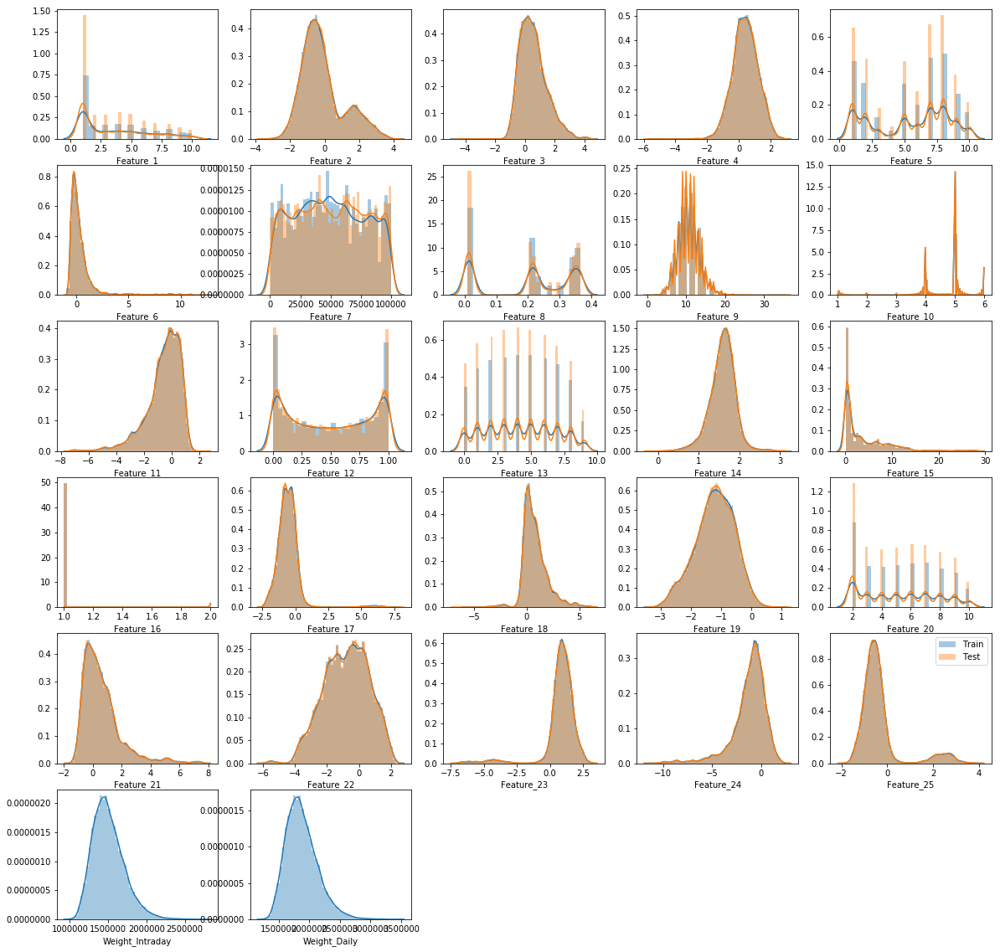

In [0]:
fig = plt.figure(figsize=(20,20))
columns = featureColumns + weightColumns
nCols = 5
nRows = ceil(len(columns)/nCols)
dfTrainColumns = dfTrain.columns
dfTestColumns = dfTest.columns
for idx, col in enumerate(columns):
  if col in dfTrainColumns:
    ax = plt.subplot(nRows,nCols,idx+1)
    sns.distplot(dfTrain[col].dropna(), ax=ax, label='Train')
for idx, col in enumerate(columns):
  if col in dfTestColumns:
    ax = plt.subplot(nRows,nCols,idx+1)
    sns.distplot(dfTest[col].dropna(), ax=ax, label='Test')
plt.legend()
plt.show()

Finding correlation between features

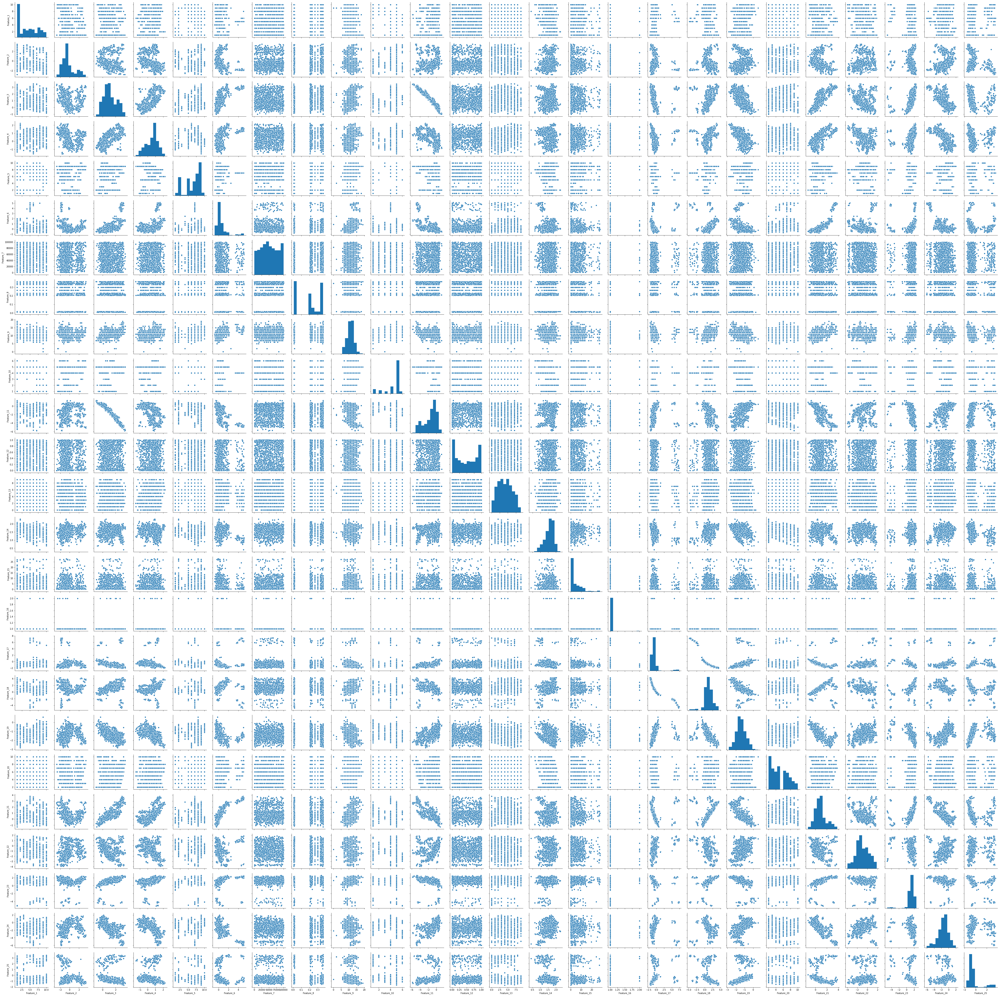

In [0]:
sns.pairplot(dfTrain[featureColumns].dropna(), vars=featureColumns)

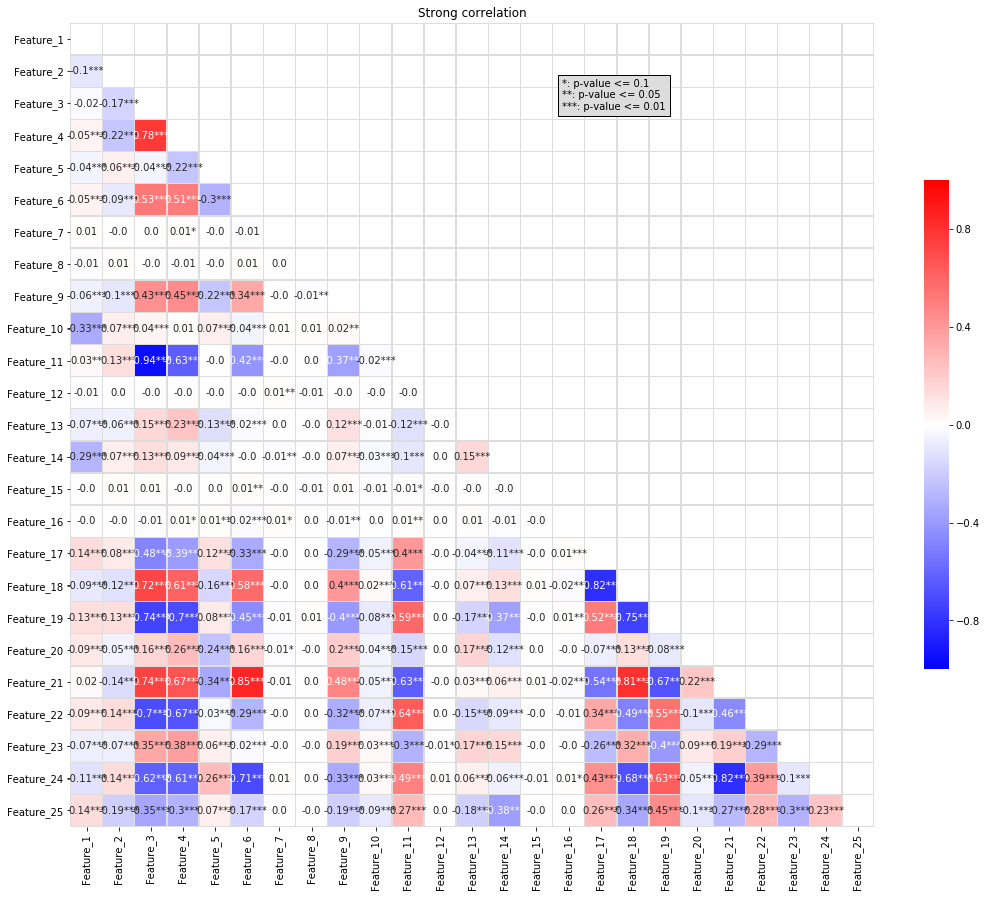

In [0]:
plotCorr(dfTrain[featureColumns], title='Strong correlation')

### Return columns

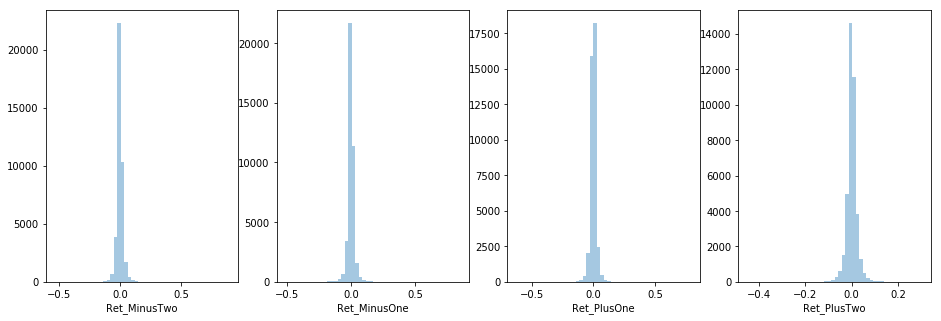

In [0]:
fig = plt.figure(figsize=(20,5))
columns = dayRetColumns
nCols = 5
nRows = ceil(len(columns)/nCols)
for idx, col in enumerate(columns):
  ax = plt.subplot(nRows,nCols,idx+1)
  sns.distplot(dfTrain[col].dropna(), ax=ax, kde=False)

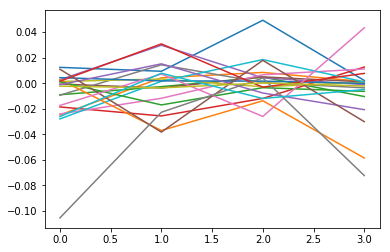

In [0]:
plt.plot(dfTrain[dayRetColumns].sample(20).to_numpy().transpose())
plt.show()

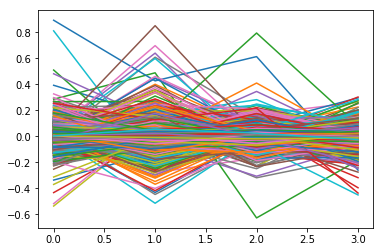

In [0]:
plt.plot(dfTrain.loc[:, dayRetColumns].to_numpy().transpose())
plt.show()

Seeing differences of return between days

In [0]:
def extractDiff(s):
    return pd.Series([s['Ret_MinusOne']-s['Ret_MinusTwo'],s['Ret_PlusOne']-s['Ret_MinusOne'],s['Ret_PlusTwo']-s['Ret_PlusOne']])
dfDayRetDiff = dfTrain[dayRetColumns].apply(extractDiff, axis=1)

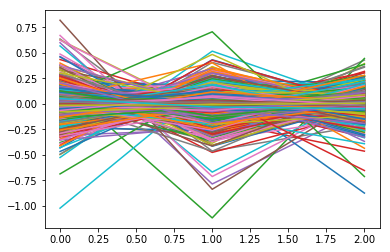

In [0]:
plt.plot(dfDayRetDiff.to_numpy().transpose())
plt.show()

Finding if there are any clusters depending on some features. It seems not useful to me yet.

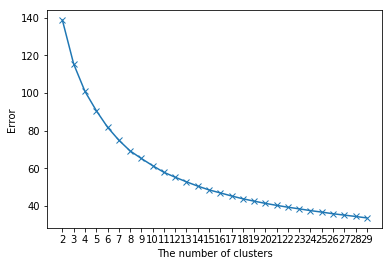

In [157]:
dfClustering = dfDayRetDiff
possibleKs = np.arange(2,30)
errors = []
for kcluster in possibleKs:
    kmeans = KMeans(n_clusters=kcluster, n_init=20, random_state=seed).fit(dfClustering)
    errors.append(kmeans.inertia_)
    
    l = len(errors)

    clear_output(wait=True)
    plt.plot(possibleKs[:l], errors, marker='x')
    plt.ylabel('Error')
    plt.xlabel('The number of clusters')
    plt.xticks(possibleKs[:l])
    plt.show()

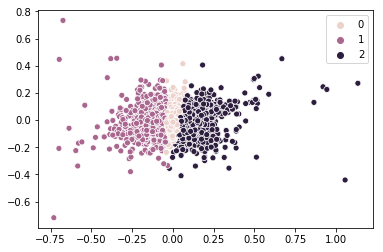

In [0]:
pca = PCA(n_components=2)
pcaScore = pca.fit_transform(dfClustering)
labels = KMeans(n_clusters=3, n_init=100, random_state=seed).fit_predict(dfClustering)
# print(pcaScore.shape,labels.shape)
sns.scatterplot(x=pcaScore[:,0], y=pcaScore[:,1], hue=labels)
plt.show()

### Etc

Finding correlation among those *Feature_i*, *Ret_i*, and some customized return columns. Here we found some features are correlated with each other including target return i.e.
1. Sums of returns over training returns (i.e. Ret_MinusTwo, Ret_MinusOne, Ret_2-120) have positive correation on Ret_PlusOne, Ret_PlusTwo, Sums over all target returns, Sum over day target returns
2. Magnitures of training returns have positive correlation on magnitudes of target returns.

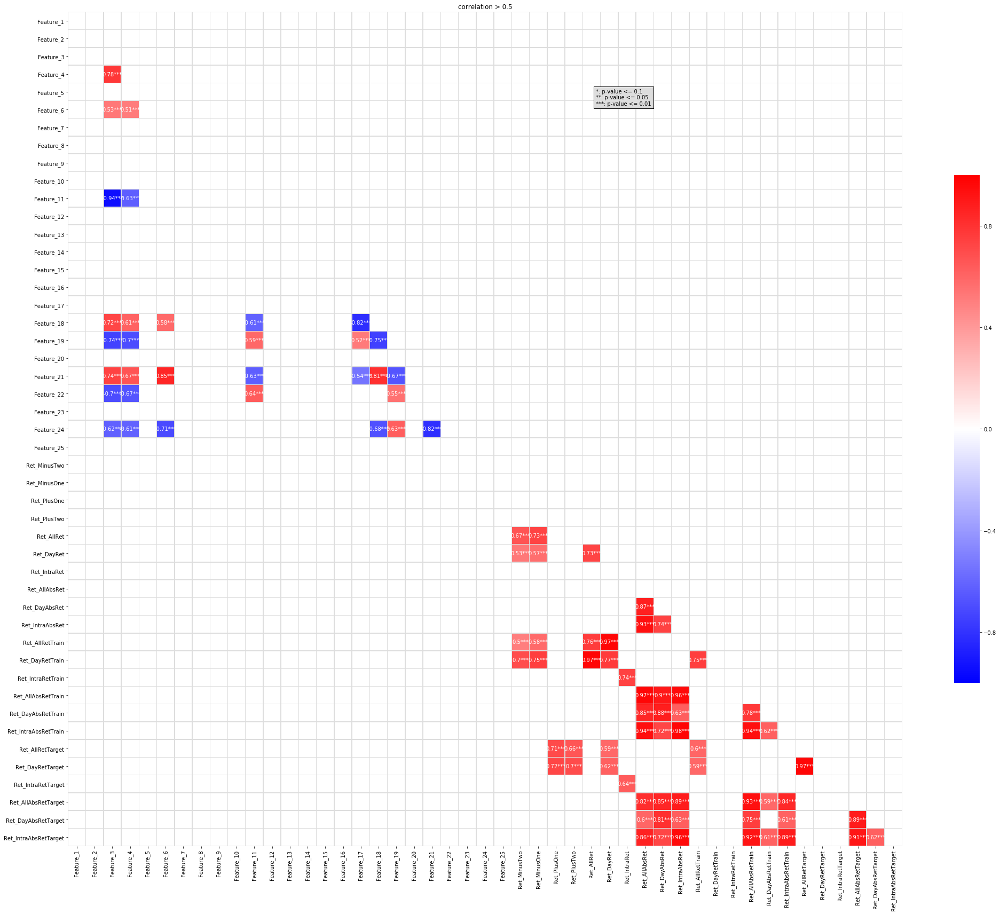

In [0]:
plotCorr(dfTrain[featureColumns+dayRetColumns+customRetColumns], corr_threshold=0.5, title='correlation >= 0.5')

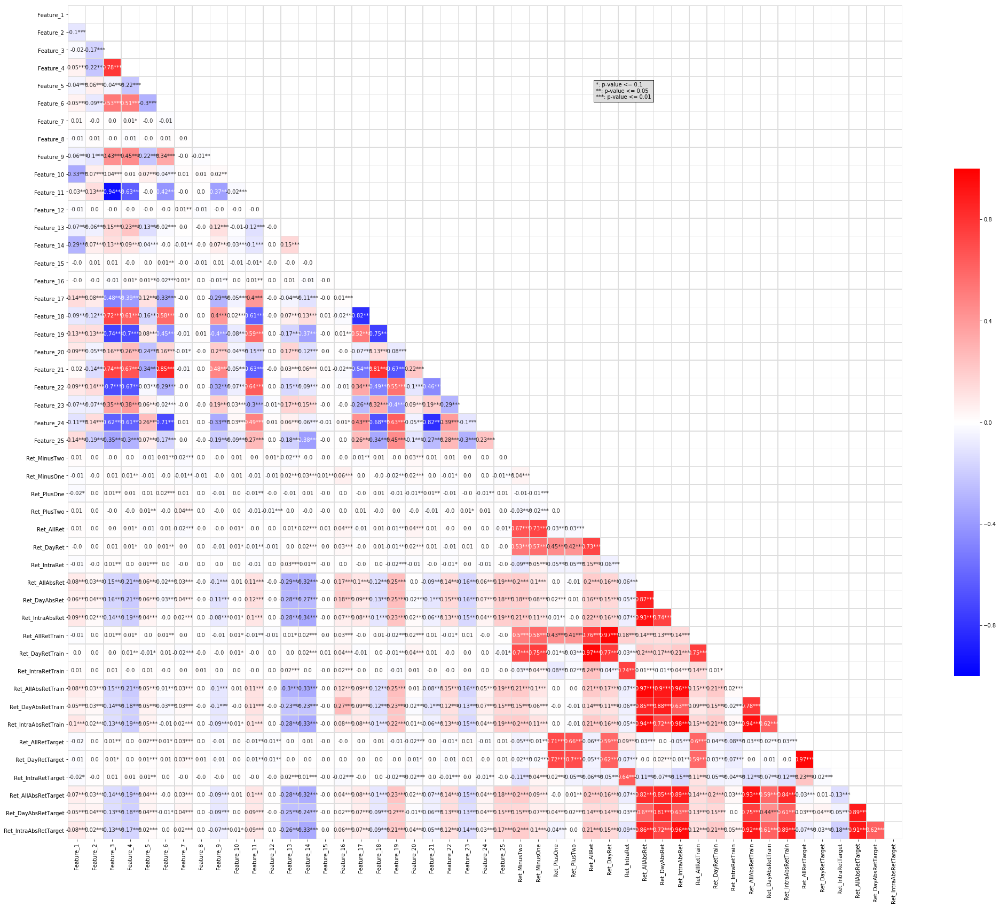

In [0]:
plotCorr(dfTrain[featureColumns+dayRetColumns+customRetColumns])

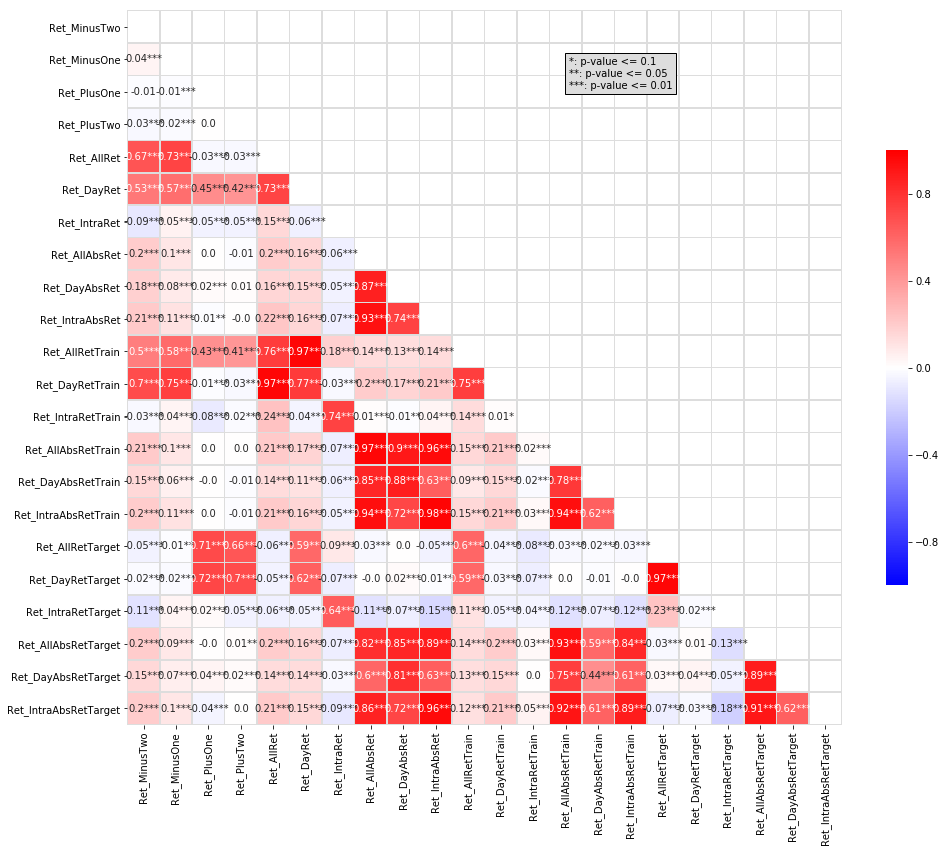

In [0]:
plotCorr(dfTrain[dayRetColumns+customRetColumns])

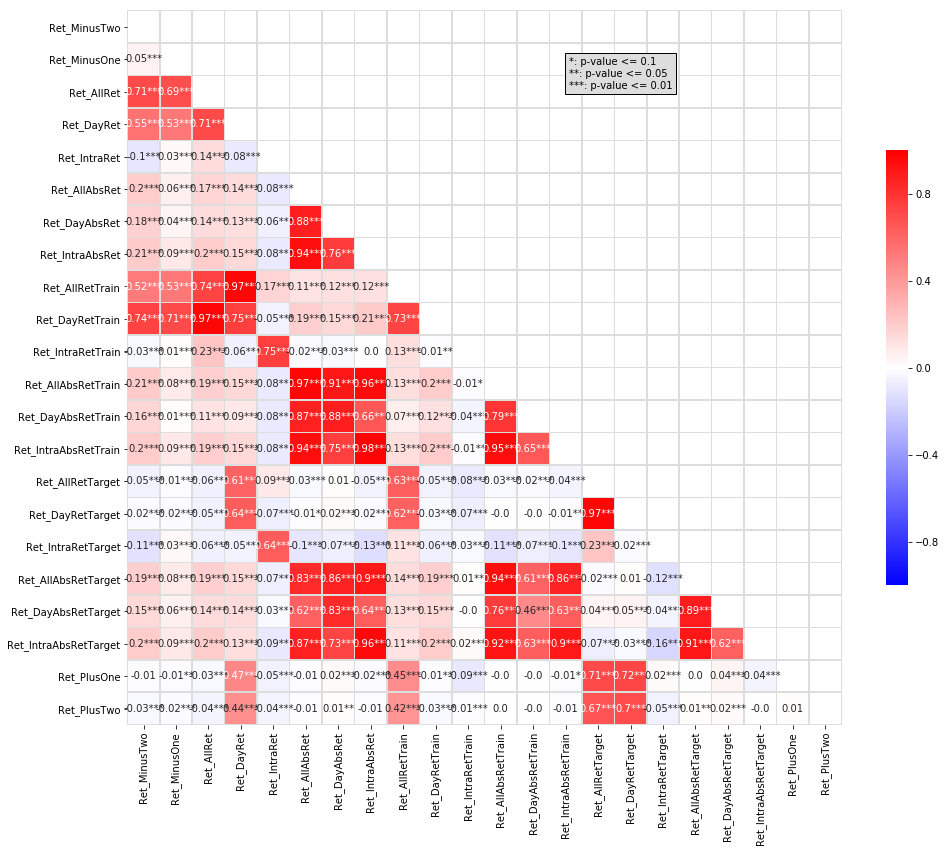

In [0]:
plotCorr(dfTrain.loc[dfTrain['Feature_16']==1, dayRetTrainColumns+customRetColumns+dayRetTargetColumns])

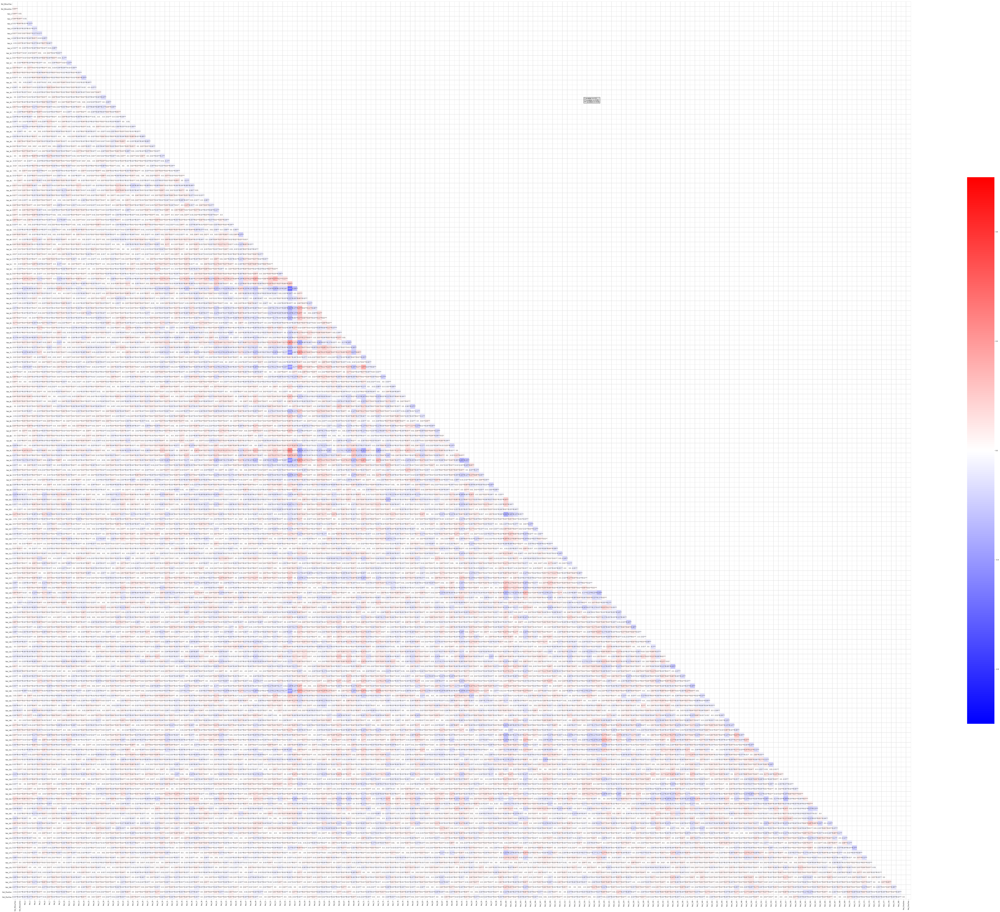

In [0]:
plotCorr(dfTrain[allRetColumns])

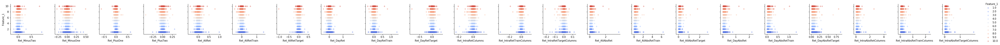

In [0]:
feature = 'Feature_1'
sns.pairplot(dfTrain.dropna(subset=[feature]), hue=feature, markers="+", palette='coolwarm', x_vars=dayRetColumns+customRetColumns, y_vars=[feature])
# sns.pairplot(dfTrain.dropna(subset=[feature]).assign(Feature_25_cat=dfTrain['Feature_25'].apply(lambda x: '<1' if x<1 else '>=1')), hue='Feature_25_cat', markers="+", palette='coolwarm', x_vars=dayRetColumns+customRetColumns, y_vars=[feature])
plt.show()

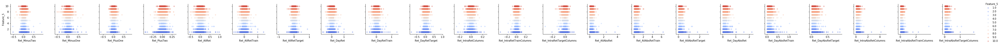

In [0]:
feature = 'Feature_5'
sns.pairplot(dfTrain.dropna(subset=[feature]), hue=feature, markers="+", palette='coolwarm', x_vars=dayRetColumns+customRetColumns, y_vars=[feature])
plt.show()

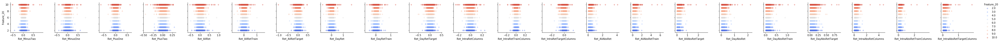

In [0]:
feature = 'Feature_20'
sns.pairplot(dfTrain.dropna(subset=[feature]), hue=feature, markers="+", palette='coolwarm', x_vars=dayRetColumns+customRetColumns, y_vars=[feature])
plt.show()

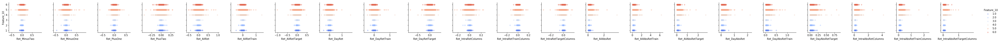

In [0]:
feature = 'Feature_10'
sns.pairplot(dfTrain.dropna(subset=[feature]), hue=feature, markers="+", palette='coolwarm', x_vars=dayRetColumns+customRetColumns, y_vars=[feature])
plt.show()

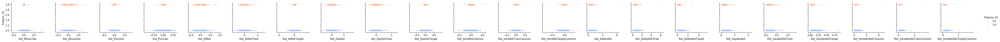

In [0]:
feature = 'Feature_16'
sns.pairplot(dfTrain.dropna(subset=[feature]), hue=feature, markers="+", palette='coolwarm', x_vars=dayRetColumns+customRetColumns, y_vars=[feature])
plt.show()

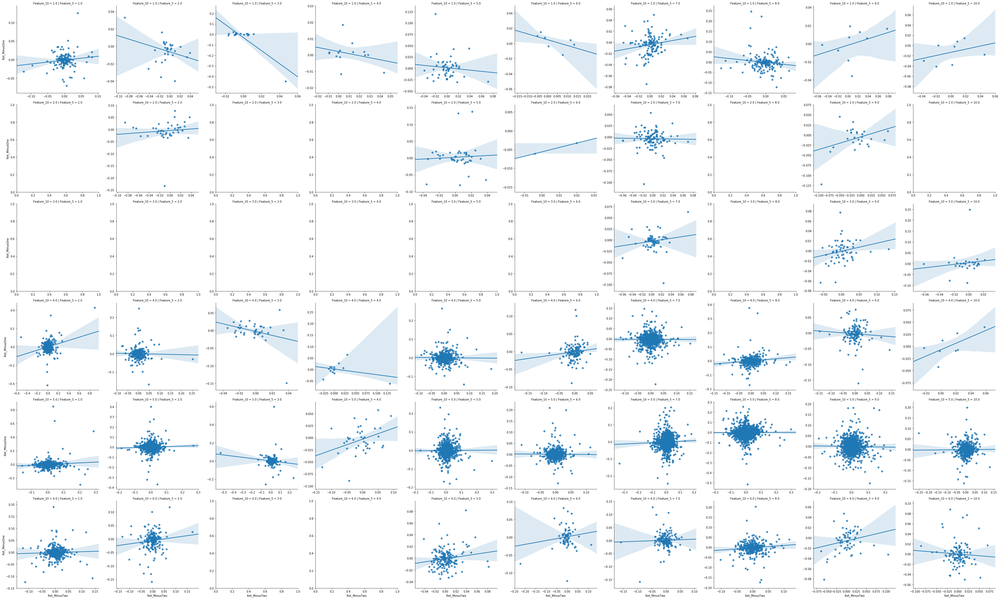

In [0]:
col1, col2 = 'Ret_MinusTwo', 'Ret_MinusOne'
sns.lmplot(x=col1, y=col2, col='Feature_5', row='Feature_10',# hue='Feature_7',
           sharex=False, sharey=False,
           data=dfTrain)
plt.show()

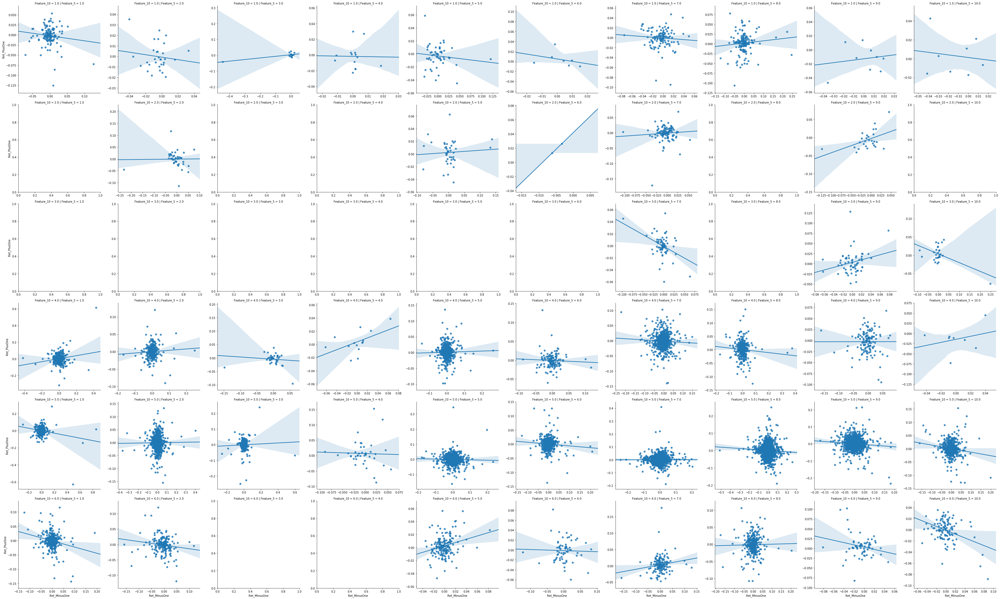

In [0]:
col1, col2 = 'Ret_MinusOne', 'Ret_PlusOne'
sns.lmplot(x=col1, y=col2, col='Feature_5', row='Feature_10',# hue='Feature_7',
           sharex=False, sharey=False,
           data=dfTrain)
plt.show()

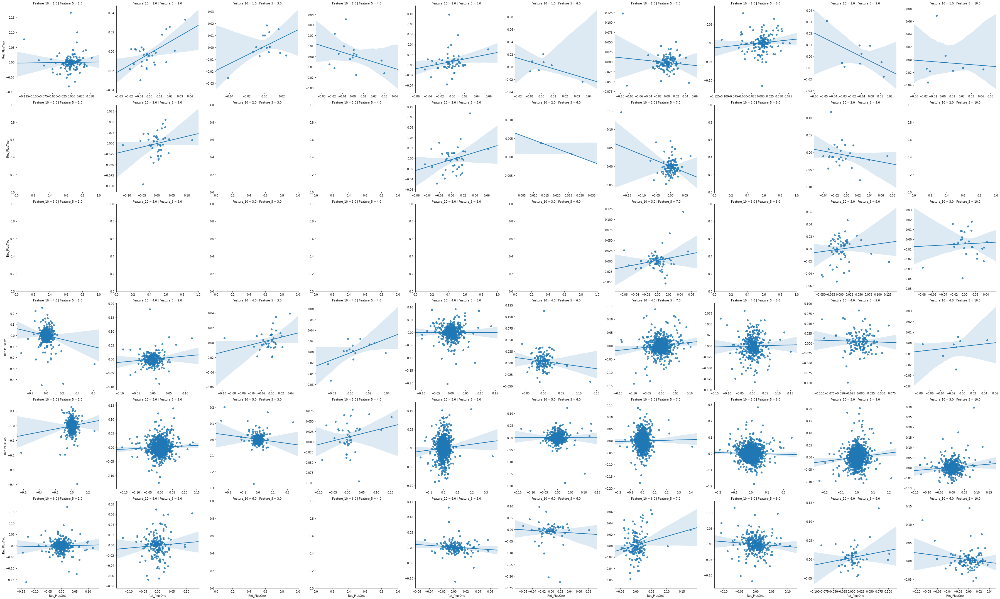

In [0]:
col1, col2 = 'Ret_PlusOne', 'Ret_PlusTwo'
sns.lmplot(x=col1, y=col2, col='Feature_5', row='Feature_10',# hue='Feature_7',
           sharex=False, sharey=False,
           data=dfTrain)
plt.show()

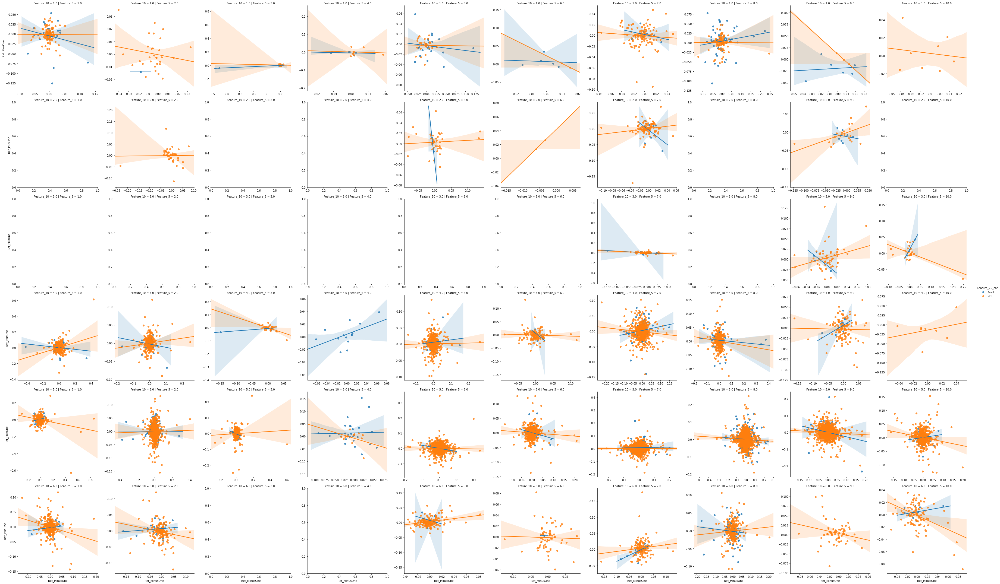

In [0]:
col1, col2 = 'Ret_MinusOne', 'Ret_PlusOne'
sns.lmplot(x=col1, y=col2, col='Feature_5', row='Feature_10', hue='Feature_25_cat',
           sharex=False, sharey=False,
           data=dfTrain.assign(Feature_25_cat=dfTrain['Feature_25'].apply(lambda x: '<1' if x<1 else '>=1')))
plt.show()

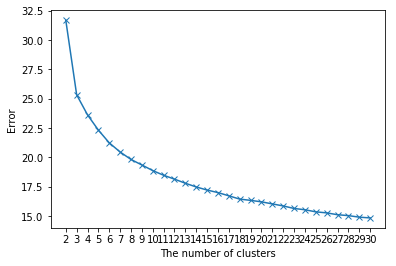

In [0]:
dfClustering = dfTrain[featureColumns].groupby('Feature_7').agg(lambda g: g.isnull().mean())
possibleKs = np.arange(2,31)
errors = []
for kcluster in possibleKs:
    kmeans = KMeans(n_clusters=kcluster, n_init=50, random_state=seed).fit(dfClustering)
    errors.append(kmeans.inertia_)
    
    l = len(errors)

    clear_output(wait=True)
    plt.plot(possibleKs[:l], errors, marker='x')
    plt.ylabel('Error')
    plt.xlabel('The number of clusters')
    plt.xticks(possibleKs[:l])
    plt.show()

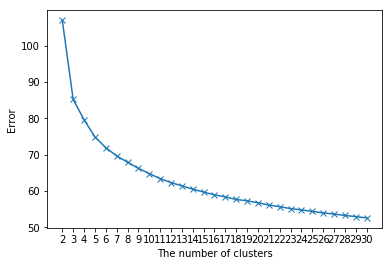

In [0]:
dfClustering = dfTest[featureColumns].groupby('Feature_7').agg(lambda g: g.isnull().mean())
possibleKs = np.arange(2,31)
errors = []
for kcluster in possibleKs:
    kmeans = KMeans(n_clusters=kcluster, n_init=50, random_state=seed).fit(dfClustering)
    errors.append(kmeans.inertia_)
    
    l = len(errors)

    clear_output(wait=True)
    plt.plot(possibleKs[:l], errors, marker='x')
    plt.ylabel('Error')
    plt.xlabel('The number of clusters')
    plt.xticks(possibleKs[:l])
    plt.show()

## Building predictive models for Daily returns

The best model for Daily returns is MLP (hidden=[200,200], dropout=0.5, hidden_activation='ReLU'). Note that we have not done hyperparameter tuning. We may use grid search for hyperparameters and we may get better models.

```
Moving Average Loss = 74083.64316616843
LR Loss: 56504.936727416396
MLP Loss (hidden=[200,200], dropout=0.5): 42663.24343606034
** MLP (hidden=[200,200], dropout=0.5, hidden_activation='ReLU') Loss: 33412.842708030345
```



The magnitudes of *Ret_MinusTwo*, *Ret_MinusOne* are similar, even though *Ret_MinusOne* is sum over half day. So we don't need to double *Ret_MinusOne*.

In [0]:
dfTrain[dayRetTrainColumns].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Ret_MinusTwo,40000.0,0.000784,0.028279,-0.536283,-0.010687,0.000112,0.010987,0.894024
Ret_MinusOne,40000.0,-0.000803,0.030569,-0.514720,-0.010830,-0.000665,0.008976,0.852139


In [0]:
dfTest[dayRetTrainColumns].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Ret_MinusTwo,120000.0,-0.000343,0.026620,-0.601525,-0.010859,-0.000401,0.010008,0.95854
Ret_MinusOne,120000.0,0.000206,0.030448,-0.574423,-0.010298,-0.000163,0.009937,1.95263


### Moving average [Baseline]

Although there is no linear correlation between *Ret_MinusTwo*, *Ret_MinusOne*, we are going to use moving average as a baseline for advanced models.

Since this model does not have any parameters to be trained, no needs to split data into training/validation set

**Result:** Performing moving average over all history data is the best (i.e. doing average over all previous steps) with loss 

```
loss = 74083.64316616843
```

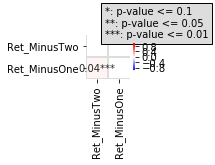

In [0]:
plotCorr(dfTrain[['Ret_MinusTwo','Ret_MinusOne']])

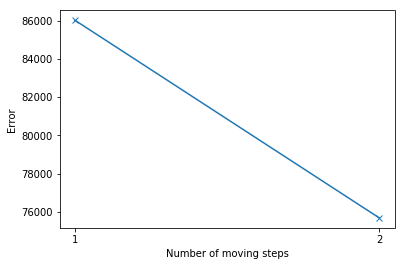

Time used: 0 secs
Best number of steps is 2 with error 75675.51406179187


In [0]:
# Fix number of steps
timeStart = time.time()

# Number of steps for Moving Average from 1 previous step (only previous step) to 119 previous steps
maSteps = range(1,len(dayRetTrainColumns)+1)

target = dayRetTargetColumns
weights = dfTrain['Weight_Daily'].to_numpy()
losses = []

for maStep in maSteps:

  dfMA = dfTrain[dayRetTrainColumns].copy()

  for col in dayRetTargetColumns:
    dfMA[col] = dfMA[dfMA.columns[-maStep:]].mean(axis=1)

  losses.append(lossWMAE(dfMA[dayRetTargetColumns], dfTrain[dayRetTargetColumns], weights=weights))

  clear_output(wait=True)
  plt.plot(maSteps[:maStep], losses, marker='x')
  plt.ylabel('Error')
  plt.xlabel('Number of moving steps')
  plt.xticks(maSteps[:maStep])
  plt.show()

print('Time used: {:.0f} secs'.format(time.time() - timeStart))
print('Best number of steps is {} with error {}'.format(np.argmin(losses)+1, np.min(losses)))

In [0]:
# Take all previous steps into account
timeStart = time.time()

weights = dfTrain['Weight_Daily'].to_numpy()

dfMA = dfTrain[dayRetTrainColumns].copy()

for col in dayRetTargetColumns:
  dfMA[col] = dfMA.mean(axis=1)
  
lossDaily = lossWMAE(dfMA[dayRetTargetColumns], dfTrain[dayRetTargetColumns], weights=weights)

print('loss:', lossDaily)
print('Time used: {:.0f} secs'.format(time.time() - timeStart))

loss: 74083.64316616843
Time used: 0 secs


### Model overview

Let assume that all features with integer are categorical variables. So we first do one-hot encoding to all integer features.

- Suspect that *Feature_13* might not be a categorical variables since it correlates (weakly) to Return magnitude.
- Exclude *Feature_7* since it is too varying.
- Exclude other *Feature_i* because of missing values

This section is basically review basic machine learning models on thier performance without fine-tuning hyperparameter.

In [0]:
onehotColumns = ['Feature_'+str(i) for i in [1,5,9,10,13,16,20]]
X = pd.get_dummies(dfTrain[dayRetTrainColumns + customRetTrainColumns + onehotColumns], columns=onehotColumns, prefix=onehotColumns).to_numpy()
XwithWeights = pd.get_dummies(dfTrain[['Weight_Daily'] + dayRetTrainColumns + customRetTrainColumns + onehotColumns], columns=onehotColumns, prefix=onehotColumns).to_numpy()
y = dfTrain[['Ret_PlusOne','Ret_PlusTwo']].to_numpy()
y1 = dfTrain['Ret_PlusOne'].to_numpy()
y2 = dfTrain['Ret_PlusTwo'].to_numpy()
weights = dfTrain['Weight_Daily'].to_numpy()

Run model overview. Hard to inject custom loss (WMAE) so we use MAE instead here.

**Result:** Linear regression seems work best among of chosen models without fine-tuning hyperparameters

In [123]:
# Optimization: GridSearchCV
def trainOverview(models, X, y, cv=10, title=None):
    if title is not None:
        print(title)
    print('Evaluation using {}-fold CV'.format(cv))
    print('{:25} {:15}  {:15}  {:15}  {:15}'.format('Model', 'MAE Train', 'MAE Val', 'Train time', 'Test time'))
    for name, model in models.items():
        scalar = StandardScaler()
        pipeline = Pipeline([('transformer', scalar), ('estimator', model)])

        cvScores = cross_validate(pipeline, X, y, cv=cv,
                                  scoring='neg_median_absolute_error',
                                  return_train_score=True)
        
        print("{:25} {:6.4f} ({:6.4f})  {:6.4f} ({:6.4f})  {:6.4f} ({:6.4f})  {:6.4f} ({:6.4f})"\
              .format(name,
                      np.sqrt(-cvScores['train_score']).mean(), np.sqrt(-cvScores['train_score']).std(),
                      np.sqrt(-cvScores['test_score']).mean(), np.sqrt(-cvScores['test_score']).std(),
                      cvScores['fit_time'].mean(), cvScores['fit_time'].std(),
                      cvScores['score_time'].mean(), cvScores['score_time'].std()))

# Regression models
models = {
    'Linear Regression': LinearRegression(),
    'Lasso Regression': Lasso(alpha=0.001),
    'Ridge Regression': Ridge(alpha=0.1),
    'Decision Tree': DecisionTreeRegressor(max_depth=3, random_state=seed),
    'Random Forest': RandomForestRegressor(n_estimators=100, max_depth=3, random_state=seed),
    'XGBoost': XGBRegressor(n_estimators=100, max_depth=3, random_state=seed, objective='reg:squarederror', colsample_bytree=0.3),
    'SVM': SVR(gamma='auto'),
    'Neural Network': MLPRegressor(hidden_layer_sizes=(200,200), max_iter=500, random_state=seed)
}

trainOverview(models, X, y1, cv=5)

Evaluation using 5-fold CV
Model                     MAE Train        MAE Val          Train time       Test time      
Linear Regression         0.0880 (0.0002)  0.0881 (0.0005)  0.2426 (0.0182)  0.0067 (0.0010)
Lasso Regression          0.0881 (0.0002)  0.0880 (0.0005)  0.1780 (0.0088)  0.0060 (0.0006)
Ridge Regression          0.0880 (0.0002)  0.0881 (0.0005)  0.1438 (0.0035)  0.0055 (0.0000)
Decision Tree             0.0984 (0.0003)  0.0985 (0.0006)  0.2594 (0.0098)  0.0063 (0.0002)
Random Forest             0.0957 (0.0002)  0.0959 (0.0008)  9.6140 (0.0343)  0.0303 (0.0025)
XGBoost                   0.0896 (0.0001)  0.0901 (0.0005)  3.9840 (0.1319)  0.0341 (0.0006)
SVM                       0.1086 (0.0034)  0.1082 (0.0035)  0.8083 (0.0529)  0.1302 (0.0075)
Neural Network            0.1087 (0.0148)  0.1176 (0.0123)  15.1275 (2.6788)  0.0565 (0.0011)


### TF Models with Custom Loss

TODO: Fine-tune hyperparameters

```
LR Loss: 56504.936727416396
MLP Loss (hidden=[200,200], dropout=0.5): 42663.24343606034
** MLP (hidden=[200,200], dropout=0.5, hidden_activation='ReLU') Loss: 33412.842708030345
```

In [124]:
X_train, X_val, y_train, y_val = train_test_split(XwithWeights, y, test_size=0.2, random_state=seed)
X_train, W_train = X_train[:, 1:], X_train[:, :1]
X_val, W_val = X_val[:, 1:], X_val[:, :1]

# Normalize
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_val = scaler.transform(X_val)
X_all = scaler.transform(X)

print('Train: X {}, W {}, y {}'.format(X_train.shape, W_train.shape, y_train.shape))
print('Val: X {}, W {}, y {}'.format(X_val.shape, W_val.shape, y_val.shape))

Train: X (32000, 91), W (32000, 1), y (32000, 2)
Val: X (8000, 91), W (8000, 1), y (8000, 2)


In [0]:
BUFFER_SIZE = len(X_train)
BATCH_SIZE = 64
steps_per_epoch = len(X_train)//BATCH_SIZE

dataset_train = tf.data.Dataset.from_tensor_slices((X_train, y_train, W_train)).shuffle(BUFFER_SIZE+1)
dataset_train = dataset_train.batch(BATCH_SIZE, drop_remainder=True)

dataset_val = tf.data.Dataset.from_tensor_slices((X_val, y_val, W_val)).batch(len(X_val))

def loss_function(pred, targ, weights):
  return tf.reduce_mean(tf.reduce_sum(tf.abs(pred-targ), axis=1) * weights)

In [0]:
@tf.function
def train_step(model, optimizer, inp, targ, weights):
  loss = 0.

  with tf.GradientTape() as tape:
    pred = model(inp)

    loss += loss_function(pred, targ, weights)

  variables = model.trainable_variables
  gradients = tape.gradient(loss, variables)
  optimizer.apply_gradients(zip(gradients, variables))
  return loss

def trainModel(model, optimizer, ckptObj, ckptDir,
               dataset_train, dataset_val,
               epochs=100, patience=30):
  
  print('Checkpoint directory:', ckptLRdir)
  ckptPrefix = os.path.join(ckptDir, "ckpt")
  
  earlyStoppingCounter = 0
  minLoss = np.inf

  trainLosses = []
  valLosses = []

  for epoch in range(epochs):
    start = time.time()
    totalLoss = 0
    saveFlag = False

    for (batch, (inp, targ, weights)) in enumerate(dataset_train.take(steps_per_epoch)):
      totalLoss += train_step(model, optimizer, inp, targ, weights)

    trainLoss = totalLoss / steps_per_epoch
    trainLosses.append(trainLoss)

    for (batch, (inp, targ, weights)) in enumerate(dataset_train.take(steps_per_epoch)):
      pred = model(inp)
      valLoss = loss_function(pred, targ, weights)
      valLosses.append(valLoss)

    # saving checkpoint when better
    if valLoss < minLoss:
      ckptObj.save(file_prefix=ckptPrefix)
      minLoss = valLoss
      earlyStoppingCounter = 0
      saveFlag = True
    else:
      earlyStoppingCounter += 1

    print('Epoch {} Train Loss {:.2f}, Val Loss {:.2f}, Time {:.2f} sec {}'.format(epoch + 1, trainLoss, valLoss, time.time() - start, 'Saved !' if saveFlag else ''))

    if earlyStoppingCounter >= patience:
      print('Early Stopping !!')
      break
  return trainLosses, valLosses

#### Linear Regression (LR)

In [159]:
class LR(tf.keras.Model):
  def __init__(self, output_size=2):
    super(LR, self).__init__()
    self.fc = tf.keras.layers.Dense(output_size)

  def call(self, x):
    return self.fc(x)

LRModel = LR(output_size=2)
LROptimizer = tf.keras.optimizers.Adam()

ckptLRdir = os.path.join(ROOT_PATH+'LR_ckpt', 'ckpt-'+time.strftime("%Y%m%d-%H%M%S", time.gmtime()))
ckptLR = tf.train.Checkpoint(optimizer=LROptimizer, model=LRModel)
ckptLRPrefix = os.path.join(ckptLRdir, "ckpt")
ckptLR.save(file_prefix = ckptLRPrefix)

print(ckptLRdir)

gdrive/My Drive/Colab Notebooks/ML Projects/The Winton Stock Market Challenge/LR_ckpt/ckpt-20190721-081150


In [160]:
LRLosses = trainModel(LRModel, LROptimizer, ckptLR, ckptLRdir, dataset_train, dataset_val)

Checkpoint directory: gdrive/My Drive/Colab Notebooks/ML Projects/The Winton Stock Market Challenge/LR_ckpt/ckpt-20190721-081150
Epoch 1 Train Loss 1017376.00, Val Loss 221545.64, Time 2.15 sec Saved !
Epoch 2 Train Loss 111759.53, Val Loss 75379.95, Time 1.58 sec Saved !
Epoch 3 Train Loss 81197.13, Val Loss 55054.52, Time 1.50 sec Saved !
Epoch 4 Train Loss 67954.20, Val Loss 51621.53, Time 1.51 sec Saved !
Epoch 5 Train Loss 61796.67, Val Loss 50822.66, Time 1.51 sec Saved !
Epoch 6 Train Loss 59775.04, Val Loss 50460.61, Time 1.54 sec Saved !
Epoch 7 Train Loss 58245.05, Val Loss 48317.70, Time 1.52 sec Saved !
Epoch 8 Train Loss 57007.42, Val Loss 53352.42, Time 1.50 sec 
Epoch 9 Train Loss 56597.03, Val Loss 52562.09, Time 1.51 sec 
Epoch 10 Train Loss 56565.40, Val Loss 52944.70, Time 1.46 sec 
Epoch 11 Train Loss 56378.45, Val Loss 54275.51, Time 1.47 sec 
Epoch 12 Train Loss 56394.27, Val Loss 53181.18, Time 1.47 sec 
Epoch 13 Train Loss 56503.02, Val Loss 53248.42, Time 1.46 

In [161]:
ckptLRdir, tf.train.latest_checkpoint(ckptLRdir)

('gdrive/My Drive/Colab Notebooks/ML Projects/The Winton Stock Market Challenge/LR_ckpt/ckpt-20190721-081150',
 'gdrive/My Drive/Colab Notebooks/ML Projects/The Winton Stock Market Challenge/LR_ckpt/ckpt-20190721-081150/ckpt-8')

In [162]:
ckptLR.restore(tf.train.latest_checkpoint(ckptLRdir))
lossWMAE(LRModel(X_all).numpy(), dfTrain[dayRetTargetColumns], dfTrain['Weight_Daily'])

56504.936727416396

In [163]:
LRModel.summary()

Model: "lr_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_134 (Dense)            multiple                  184       
Total params: 184
Trainable params: 184
Non-trainable params: 0
_________________________________________________________________


#### Multilayer Perceptron (MLP)

In [144]:
class MLP(tf.keras.Model):
  def __init__(self, output_size=2, hidden_layers=[], dropout=None, hidden_activation=None):
    super(MLP, self).__init__()

    self.hasHidden = True if len(hidden_layers) > 0 else False
    
    self.hiddenLayers = tf.keras.Sequential([], name='Hidden')

    for layer in hidden_layers:
      self.hiddenLayers.add(tf.keras.layers.Dense(layer))
      
      if hidden_activation is not None:
        self.hiddenLayers.add(tf.keras.layers.Activation(hidden_activation))

      if dropout is not None:
        self.hiddenLayers.add(tf.keras.layers.Dropout(dropout))

    self.lastLayer = tf.keras.layers.Dense(output_size, name='Output')

  def call(self, x):
    if self.hasHidden:
      x = self.hiddenLayers(x)
    return self.lastLayer(x)
MLPModel = MLP(output_size=2, hidden_layers=[200, 200], dropout=0.5)
MLPOptimizer = tf.keras.optimizers.Adam()

ckptMLPdir = os.path.join(ROOT_PATH+'MLP_ckpt', 'ckpt-'+time.strftime("%Y%m%d-%H%M%S", time.gmtime()))
ckptMLP = tf.train.Checkpoint(optimizer=MLPOptimizer, model=MLPModel)
ckptMLPPrefix = os.path.join(ckptMLPdir, "ckpt")
ckptMLP.save(file_prefix = ckptMLPPrefix)

ckptMLPdir

'gdrive/My Drive/Colab Notebooks/ML Projects/The Winton Stock Market Challenge/MLP_ckpt/ckpt-20190721-074706'

In [145]:
MLPLosses = trainModel(MLPModel, MLPOptimizer, ckptMLP, ckptMLPdir, dataset_train, dataset_val)

Checkpoint directory: gdrive/My Drive/Colab Notebooks/ML Projects/The Winton Stock Market Challenge/LR_ckpt/ckpt-20190721-074555
Epoch 1 Train Loss 390605.94, Val Loss 258893.64, Time 3.34 sec Saved !
Epoch 2 Train Loss 202837.03, Val Loss 155426.54, Time 2.55 sec Saved !
Epoch 3 Train Loss 136976.12, Val Loss 87899.81, Time 2.58 sec Saved !
Epoch 4 Train Loss 101057.24, Val Loss 93329.65, Time 2.46 sec 
Epoch 5 Train Loss 79753.26, Val Loss 62607.83, Time 2.55 sec Saved !
Epoch 6 Train Loss 65972.41, Val Loss 56761.95, Time 2.53 sec Saved !
Epoch 7 Train Loss 58114.33, Val Loss 52715.39, Time 2.56 sec Saved !
Epoch 8 Train Loss 53576.87, Val Loss 49526.10, Time 2.53 sec Saved !
Epoch 9 Train Loss 50956.28, Val Loss 43090.77, Time 2.54 sec Saved !
Epoch 10 Train Loss 49464.16, Val Loss 42189.93, Time 2.55 sec Saved !
Epoch 11 Train Loss 48755.47, Val Loss 41942.11, Time 2.58 sec Saved !
Epoch 12 Train Loss 48416.35, Val Loss 39722.85, Time 2.57 sec Saved !
Epoch 13 Train Loss 47721.19,

In [146]:
ckptMLPdir, tf.train.latest_checkpoint(ckptMLPdir)

('gdrive/My Drive/Colab Notebooks/ML Projects/The Winton Stock Market Challenge/MLP_ckpt/ckpt-20190721-074706',
 'gdrive/My Drive/Colab Notebooks/ML Projects/The Winton Stock Market Challenge/MLP_ckpt/ckpt-20190721-074706/ckpt-19')

In [147]:
lossWMAE(MLPModel(X_all).numpy(), dfTrain[dayRetTargetColumns], dfTrain['Weight_Daily'])

42663.24343606034

In [148]:
ckptMLP.restore(tf.train.latest_checkpoint(ckptMLPdir))
lossWMAE(MLPModel(X_all).numpy(), dfTrain[dayRetTargetColumns], dfTrain['Weight_Daily'])

42665.70106788306

In [149]:
MLPModel.summary()

Model: "mlp_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Hidden (Sequential)          multiple                  58600     
_________________________________________________________________
Output (Dense)               multiple                  402       
Total params: 59,002
Trainable params: 59,002
Non-trainable params: 0
_________________________________________________________________


#### Multilayer Perceptron (MLP) - ReLU

In [151]:
MLPModel2 = MLP(output_size=2, hidden_layers=[200, 200], dropout=0.5, hidden_activation='relu')
MLPOptimizer2 = tf.keras.optimizers.Adam()

ckptMLPdir2 = os.path.join(ROOT_PATH+'MLP2_ckpt', 'ckpt-'+time.strftime("%Y%m%d-%H%M%S", time.gmtime()))
ckptMLP2 = tf.train.Checkpoint(optimizer=MLPOptimizer2, model=MLPModel2)
ckptMLPPrefix2 = os.path.join(ckptMLPdir, "ckpt")
ckptMLP2.save(file_prefix = ckptMLPPrefix2)

ckptMLPdir2

'gdrive/My Drive/Colab Notebooks/ML Projects/The Winton Stock Market Challenge/MLP2_ckpt/ckpt-20190721-075132'

In [152]:
MLPLosses2 = trainModel(MLPModel2, MLPOptimizer2, ckptMLP2, ckptMLPdir2, dataset_train, dataset_val)

Checkpoint directory: gdrive/My Drive/Colab Notebooks/ML Projects/The Winton Stock Market Challenge/LR_ckpt/ckpt-20190721-074555
Epoch 1 Train Loss 195039.58, Val Loss 73135.21, Time 3.42 sec Saved !
Epoch 2 Train Loss 63790.00, Val Loss 38337.27, Time 2.73 sec Saved !
Epoch 3 Train Loss 51692.99, Val Loss 36550.09, Time 2.75 sec Saved !
Epoch 4 Train Loss 48302.89, Val Loss 35797.38, Time 2.75 sec Saved !
Epoch 5 Train Loss 46259.50, Val Loss 33543.05, Time 2.74 sec Saved !
Epoch 6 Train Loss 45415.59, Val Loss 34984.92, Time 2.61 sec 
Epoch 7 Train Loss 44367.07, Val Loss 34977.11, Time 2.63 sec 
Epoch 8 Train Loss 43976.69, Val Loss 32868.98, Time 2.64 sec Saved !
Epoch 9 Train Loss 43455.88, Val Loss 34649.22, Time 2.60 sec 
Epoch 10 Train Loss 43354.11, Val Loss 36297.56, Time 2.57 sec 
Epoch 11 Train Loss 43031.51, Val Loss 34195.19, Time 2.61 sec 
Epoch 12 Train Loss 42613.63, Val Loss 35074.28, Time 2.60 sec 
Epoch 13 Train Loss 42374.29, Val Loss 33029.67, Time 2.60 sec 
Epoch

In [153]:
ckptMLPdir2, tf.train.latest_checkpoint(ckptMLPdir2)

('gdrive/My Drive/Colab Notebooks/ML Projects/The Winton Stock Market Challenge/MLP2_ckpt/ckpt-20190721-075132',
 'gdrive/My Drive/Colab Notebooks/ML Projects/The Winton Stock Market Challenge/MLP2_ckpt/ckpt-20190721-075132/ckpt-18')

In [154]:
ckptMLP2.restore(tf.train.latest_checkpoint(ckptMLPdir2))
lossWMAE(MLPModel2(X_all).numpy(), dfTrain[dayRetTargetColumns], dfTrain['Weight_Daily'])

33412.842708030345

In [155]:
MLPModel2.summary()

Model: "mlp_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
Hidden (Sequential)          multiple                  58600     
_________________________________________________________________
Output (Dense)               multiple                  402       
Total params: 59,002
Trainable params: 59,002
Non-trainable params: 0
_________________________________________________________________


## Building predictive models for Intraday returns

```
Moving Average Loss: 54970.07993811436
RNN with context Loss: ...
Self-attention Loss: ...
```

### Moving Average [Baseline]

Since this model does not have any parameters to be trained, no needs to split data into training/validation set

**Result:** Performing moving average over all history data is the best (i.e. doing average over all previous steps)

```
loss = 54970.07993811436
```

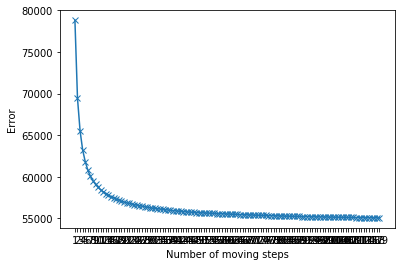

Time used: 416 secs


In [0]:
# Fix number of steps
timeStart = time.time()

# Number of steps for Moving Average from 1 previous step (only previous step) to 119 previous steps
maSteps = range(1,len(intraRetTrainColumns)+1)

weights = dfTrain['Weight_Intraday'].to_numpy()
losses = []

for maStep in maSteps:

  dfMA = dfTrain[intraRetTrainColumns].copy()

  for col in intraRetTargetColumns:
    dfMA[col] = dfMA[dfMA.columns[-maStep:]].mean(axis=1)

  losses.append(lossWMAE(dfMA[intraRetTargetColumns], dfTrain[intraRetTargetColumns], weights=weights))

  clear_output(wait=True)
  plt.plot(maSteps[:maStep], losses, marker='x')
  plt.ylabel('Error')
  plt.xlabel('Number of moving steps')
  plt.xticks(maSteps[:maStep])
  plt.show()

print('Time used: {:.0f} secs'.format(time.time() - timeStart))
print('Best number of steps is {} with error {}'.format(np.argmin(losses)+1, np.min(losses)))

In [0]:
# Take all previous steps into account
timeStart = time.time()

weights = dfTrain['Weight_Intraday'].to_numpy()

dfMA = dfTrain[intraRetTrainColumns].copy()

for col in intraRetTargetColumns:
  dfMA[col] = dfMA.mean(axis=1)

print('loss:', lossWMAE(dfMA[intraRetTargetColumns], dfTrain[intraRetTargetColumns], weights=weights))
print('Time used: {:.0f} secs'.format(time.time() - timeStart))

loss: 54970.07993811436
Time used: 3 secs


### TF Models with Custom Loss

In [0]:
onehotColumns = ['Feature_'+str(i) for i in [1,5,9,10,13,16,20]]
Xcontext = pd.get_dummies(dfTrain[customRetTrainColumns + onehotColumns], columns=onehotColumns, prefix=onehotColumns).to_numpy()
XcontextWithWeights = pd.get_dummies(dfTrain[['Weight_Intraday'] + customRetTrainColumns + onehotColumns], columns=onehotColumns, prefix=onehotColumns).to_numpy()

# TODO: replace np.nan_to_num with masking on the model
Xret = np.nan_to_num(dfTrain[intraRetTrainColumns].to_numpy())
X = np.concatenate([XcontextWithWeights, Xret], axis=1)

y = dfTrain[intraRetTargetColumns].to_numpy()
weights = dfTrain['Weight_Intraday'].to_numpy()

print(XcontextWithWeights.shape, Xret.shape)

(40000, 90) (40000, 119)


In [0]:
X_train, X_val, y_train, y_val = train_test_split(tf.cast(X, tf.float32).numpy(), y, test_size=0.2, random_state=seed)
X_train, W_train, C_train = X_train[:, -119:], X_train[:, :1], X_train[:, 1:90]
X_val, W_val, C_val = X_val[:, -119:], X_val[:, :1], X_val[:, 1:90]

# Normalize
scaler = StandardScaler()
scaler.fit(C_train)
C_train = scaler.transform(C_train)
C_val = scaler.transform(C_val)
C_all = scaler.transform(Xcontext)

print('Train: X {}, W {}, C {}, y {}'.format(X_train.shape, W_train.shape, C_train.shape, y_train.shape))
print('Val: X {}, W {}, C {}, y {}'.format(X_val.shape, W_val.shape, C_val.shape, y_val.shape))

Train: X (32000, 119), W (32000, 1), C (32000, 89), y (32000, 60)
Val: X (8000, 119), W (8000, 1), C (8000, 89), y (8000, 60)


In [0]:
BUFFER_SIZE = len(X_train)
BATCH_SIZE = 64
steps_per_epoch = len(X_train)//BATCH_SIZE

dataset_train = tf.data.Dataset.from_tensor_slices((tf.expand_dims(X_train,-1), y_train, W_train, C_train)).shuffle(BUFFER_SIZE+1)
dataset_train = dataset_train.batch(BATCH_SIZE, drop_remainder=True)

dataset_val = tf.data.Dataset.from_tensor_slices((tf.expand_dims(X_val,-1), y_val, W_val, C_val)).batch(len(X_val))

def loss_function(pred, targ, weights):
  return tf.reduce_mean(tf.abs(pred-targ) * weights)

#### RNN with context
The idea is to embed features (*Feature_i*) into initial hidden states then doing RNN until finish encoder. After we get final hidden states, we then feed to decoder to generate intraday return values.

In [0]:
@tf.function
def train_step(encoder, decoder, optimizer, inp, context, targ, weights):
  loss = 0.

  with tf.GradientTape() as tape:
    enc_hidden = encoder(inp[:, :-1], context)
    dec_input = tf.expand_dims(inp[:, -1], 1) # Last input

    # Teacher forcing - feeding the target as the next input
    for t in range(0, targ.shape[1]):
      # passing enc_output to the decoder
      pred, dec_hidden = decoder(dec_input, dec_hidden)

      loss += loss_function(targ[:, t], pred)

      # using teacher forcing
      dec_input = tf.expand_dims(targ[:, t], 1)

  variables = encoder.trainable_variables + decoder.trainable_variables
  gradients = tape.gradient(loss, variables)
  optimizer.apply_gradients(zip(gradients, variables))
  return loss

def trainModel(encoder, decoder, optimizer, ckptObj, ckptDir,
               dataset_train, dataset_val,
               epochs=100, patience=30):
  
  print('Checkpoint directory:', ckptLRdir)
  ckptPrefix = os.path.join(ckptDir, "ckpt")
  
  earlyStoppingCounter = 0
  minLoss = np.inf

  trainLosses = []
  valLosses = []

  for epoch in range(epochs):
    start = time.time()
    totalLoss = 0
    saveFlag = False

    for (batch, (inp, targ, weights, context)) in enumerate(dataset_train.take(steps_per_epoch)):
      totalLoss += train_step(encoder, decoder, optimizer, inp, context, targ, weights)

    trainLoss = totalLoss / steps_per_epoch
    trainLosses.append(trainLoss)

    for (batch, (inp, targ, weights, context)) in enumerate(dataset_train.take(steps_per_epoch)):
      enc_hidden = encoder(inp[:, :-1], context)
      dec_input = tf.expand_dims(inp[:, -1], 1) # Last input

      # Teacher forcing - feeding the target as the next input
      for t in range(0, targ.shape[1]):
        # passing enc_output to the decoder
        pred, dec_hidden = decoder(dec_input, dec_hidden)

        valLoss += loss_function(targ[:, t], pred)

        # using teacher forcing
        dec_input = tf.expand_dims(targ[:, t], 1)
      valLosses.append(valLoss)

    # saving checkpoint when better
    if valLoss < minLoss:
      ckptObj.save(file_prefix=ckptPrefix)
      minLoss = valLoss
      earlyStoppingCounter = 0
      saveFlag = True
    else:
      earlyStoppingCounter += 1

    print('Epoch {} Train Loss {:.2f}, Val Loss {:.2f}, Time {:.2f} sec {}'.format(epoch + 1, trainLoss, valLoss, time.time() - start, 'Saved !' if saveFlag else ''))

    if earlyStoppingCounter >= patience:
      print('Early Stopping !!')
      break
  return trainLosses, valLosses

In [116]:
class RNNwithContextEncoder(tf.keras.Model):
  def __init__(self, enc_units, batch_size):
    super(RNNwithContextEncoder, self).__init__()

    self.batch_size = batch_size
    self.enc_units = enc_units
    
    self.contextLayer = tf.keras.Sequential([
        tf.keras.layers.Dense(200),
        tf.keras.layers.Dense(200),
        tf.keras.layers.Dense(enc_units)
    ], name='Context')

    # TODO: Add bidirectional RNN
    self.gru = tf.keras.layers.GRU(enc_units, recurrent_initializer='glorot_uniform')

  def call(self, x, context):
    hidden = self.contextLayer(context)
    state = self.gru(x, initial_state = hidden)

    return state

  def initialize_hidden_state(self):
    return tf.zeros((self.batch_size, self.enc_units))

class RNNwithContextDecoder(tf.keras.Model):
  def __init__(self, dec_units, batch_size):
    super(RNNwithContextDecoder, self).__init__()
    self.batch_size = batch_size
    self.dec_units = dec_units
    
    self.gruCell = tf.keras.layers.GRUCell(self.dec_units)
    self.fc = tf.keras.layers.Dense(1)

  def call(self, x, states):
    states = self.gruCell(x, states=states)
    x = self.fc(states)

    return x, states

UNITS = 128
RNNEncoderModel = RNNwithContextEncoder(enc_units=UNITS, batch_size=BATCH_SIZE)
RNNDecoderModel = RNNwithContextDecoder(dec_units=UNITS, batch_size=BATCH_SIZE)
RNNOptimizer = tf.keras.optimizers.Adam()

ckptRNNdir = os.path.join(ROOT_PATH+'RNN_ckpt', 'ckpt-'+time.strftime("%Y%m%d-%H%M%S", time.gmtime()))
ckptRNN = tf.train.Checkpoint(optimizer=RNNOptimizer, encoder=RNNEncoderModel, decoder=RNNDecoderModel)
ckptRNN.save(file_prefix = ckptRNNdir)

ckptRNNdir

'gdrive/My Drive/Colab Notebooks/ML Projects/The Winton Stock Market Challenge/RNN_ckpt/ckpt-20190721-071357'

In [120]:
# Problem !!!: cannot use GRUCell. Needs further investigation.
XXX,yyy,WWW,CCC = next(iter(dataset_train))
RNNDecoderModel(XXX, states)

InvalidArgumentError: ignored